# Project about cool data visualization

As a fan of Fifa game (because I played in this game during my stationary studies) Detailed attributes for every player registered in the latest edition of FIFA 19 database.

Github for scraping data: https://github.com/amanthedorkknight/fifa18-all-player-statistics/tree/master/2019

Original data source: https://sofifa.com/

# Packages

In [1]:
import pandas as pd
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from copy import deepcopy
import plotly

# Preprocessing data

Description of variables:
- ID - unique id for player;
- Name - real name in game;
- Age - real age in 2019, cause dataset is from fifa 2019;
- Photo - link with photo of player;
- Nationality - country where the player comes from;
- Flag - link for flag;
- Overall - global rate skill for player;
- Potential - skill which can be achieved by player before end of the career;
- Club - club where player play;
- Club logo - link with logo of club;
- Value - real value of player if we want to buy him;
- Wage - wage of player per week in manager mode;
- Special - still unidentified by me;
- Preferred Foot - which leg is preferred by player;
- International Reputation - rating of reputation;
- Weak Foot - skills of weak foot;
- Skill Moves - rated skill in making tricks (this can define what moves player can do);
- Work Rate - his work rate which is hard to define, but it means how player is engage in the game;
- Body Type - description of his body;
- Real Face - categorical which means if in the game we have real face or not;
- Position - main position for play;
- Jersey Number - his number on shirt;
- Joined - date when player joined to the club;
- Loaned From - if player is loaned from so here we have from which club;
- Contract Valid Until - date with term of contract;
- Height - height of player in lbs;
- Weight - weight of player;
- Many variables about skill which can be achieved on specific position in game: 'LS', 'ST', 'RS', 'LW', 'LF', 'CF', 'RF', 'RW',
       'LAM', 'CAM', 'RAM', 'LM', 'LCM', 'CM', 'RCM', 'RM', 'LWB', 'LDM',
       'CDM', 'RDM', 'RWB', 'LB', 'LCB', 'CB', 'RCB', 'RB'.
- Next columns with value of specific skills: 'Crossing',
       'Finishing', 'HeadingAccuracy', 'ShortPassing', 'Volleys', 'Dribbling',
       'Curve', 'FKAccuracy', 'LongPassing', 'BallControl', 'Acceleration',
       'SprintSpeed', 'Agility', 'Reactions', 'Balance', 'ShotPower',
       'Jumping', 'Stamina', 'Strength', 'LongShots', 'Aggression',
       'Interceptions', 'Positioning', 'Vision', 'Penalties', 'Composure',
       'Marking', 'StandingTackle', 'SlidingTackle', 'GKDiving', 'GKHandling',
       'GKKicking', 'GKPositioning', 'GKReflexes'.
- Release Clause - how much we should pay in game if we want to resign from player.

Reason for analysis: In fact there is few reason to analyze. For example which country have good players, also what we can choose if we want best club, or country in manager mode in Fifa game.

In [2]:
DATA_PATH=os.getcwd()+'/data/'
file='data.csv'

df_raw=pd.read_csv(DATA_PATH+file,index_col=0)

df=deepcopy(df_raw)
df.head(n=5)

,ID,Name,Age,Photo,Nationality,Flag,Overall,Potential,Club,Club Logo,...,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release Clause
0,158023,L. Messi,31,https://cdn.sofifa.org/players/4/19/158023.png,Argentina,https://cdn.sofifa.org/flags/52.png,94,94,FC Barcelona,https://cdn.sofifa.org/teams/2/light/241.png,...,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,€226.5M
1,20801,Cristiano Ronaldo,33,https://cdn.sofifa.org/players/4/19/20801.png,Portugal,https://cdn.sofifa.org/flags/38.png,94,94,Juventus,https://cdn.sofifa.org/teams/2/light/45.png,...,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,€127.1M
2,190871,Neymar Jr,26,https://cdn.sofifa.org/players/4/19/190871.png,Brazil,https://cdn.sofifa.org/flags/54.png,92,93,Paris Saint-Germain,https://cdn.sofifa.org/teams/2/light/73.png,...,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,€228.1M
3,193080,De Gea,27,https://cdn.sofifa.org/players/4/19/193080.png,Spain,https://cdn.sofifa.org/flags/45.png,91,93,Manchester United,https://cdn.sofifa.org/teams/2/light/11.png,...,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,€138.6M
4,192985,K. De Bruyne,27,https://cdn.sofifa.org/players/4/19/192985.png,Belgium,https://cdn.sofifa.org/flags/7.png,91,92,Manchester City,https://cdn.sofifa.org/teams/2/light/10.png,...,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,€196.4M


In [3]:
df.tail(n=5)

,ID,Name,Age,Photo,Nationality,Flag,Overall,Potential,Club,Club Logo,...,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release Clause
18202,238813,J. Lundstram,19,https://cdn.sofifa.org/players/4/19/238813.png,England,https://cdn.sofifa.org/flags/14.png,47,65,Crewe Alexandra,https://cdn.sofifa.org/teams/2/light/121.png,...,45.0,40.0,48.0,47.0,10.0,13.0,7.0,8.0,9.0,€143K
18203,243165,N. Christoffersson,19,https://cdn.sofifa.org/players/4/19/243165.png,Sweden,https://cdn.sofifa.org/flags/46.png,47,63,Trelleborgs FF,https://cdn.sofifa.org/teams/2/light/703.png,...,42.0,22.0,15.0,19.0,10.0,9.0,9.0,5.0,12.0,€113K
18204,241638,B. Worman,16,https://cdn.sofifa.org/players/4/19/241638.png,England,https://cdn.sofifa.org/flags/14.png,47,67,Cambridge United,https://cdn.sofifa.org/teams/2/light/1944.png,...,41.0,32.0,13.0,11.0,6.0,5.0,10.0,6.0,13.0,€165K
18205,246268,D. Walker-Rice,17,https://cdn.sofifa.org/players/4/19/246268.png,England,https://cdn.sofifa.org/flags/14.png,47,66,Tranmere Rovers,https://cdn.sofifa.org/teams/2/light/15048.png,...,46.0,20.0,25.0,27.0,14.0,6.0,14.0,8.0,9.0,€143K
18206,246269,G. Nugent,16,https://cdn.sofifa.org/players/4/19/246269.png,England,https://cdn.sofifa.org/flags/14.png,46,66,Tranmere Rovers,https://cdn.sofifa.org/teams/2/light/15048.png,...,43.0,40.0,43.0,50.0,10.0,15.0,9.0,12.0,9.0,€165K


Shape of data, which means: 18207 - players; 88 - attributes.

In [4]:
df.shape

(18207, 88)

No. of variables in first line, and the second what columns we have in data.

In [5]:
print(len(df.columns))
print(df.columns)

88
Index(['ID', 'Name', 'Age', 'Photo', 'Nationality', 'Flag', 'Overall',
       'Potential', 'Club', 'Club Logo', 'Value', 'Wage', 'Special',
       'Preferred Foot', 'International Reputation', 'Weak Foot',
       'Skill Moves', 'Work Rate', 'Body Type', 'Real Face', 'Position',
       'Jersey Number', 'Joined', 'Loaned From', 'Contract Valid Until',
       'Height', 'Weight', 'LS', 'ST', 'RS', 'LW', 'LF', 'CF', 'RF', 'RW',
       'LAM', 'CAM', 'RAM', 'LM', 'LCM', 'CM', 'RCM', 'RM', 'LWB', 'LDM',
       'CDM', 'RDM', 'RWB', 'LB', 'LCB', 'CB', 'RCB', 'RB', 'Crossing',
       'Finishing', 'HeadingAccuracy', 'ShortPassing', 'Volleys', 'Dribbling',
       'Curve', 'FKAccuracy', 'LongPassing', 'BallControl', 'Acceleration',
       'SprintSpeed', 'Agility', 'Reactions', 'Balance', 'ShotPower',
       'Jumping', 'Stamina', 'Strength', 'LongShots', 'Aggression',
       'Interceptions', 'Positioning', 'Vision', 'Penalties', 'Composure',
       'Marking', 'StandingTackle', 'SlidingTackle', 'GK

# Preprocessing data
Selection needed columns for project. Dont need photo, flag and club logo because they contains http links

In [6]:
df.loc[0,['Photo','Flag','Club Logo']]

Photo        https://cdn.sofifa.org/players/4/19/158023.png
Flag                    https://cdn.sofifa.org/flags/52.png
Club Logo      https://cdn.sofifa.org/teams/2/light/241.png
Name: 0, dtype: object

In [7]:
df.drop(['Photo','Flag','Club Logo'],axis=1,inplace=True)

Checking nan values. And also specify where we have more than 48 nan values.

In [8]:
df_nan=df.isna().sum().to_frame().rename(columns={0:'size_nan'})
df_nan[df_nan.size_nan>48].sort_values('size_nan',ascending=False)

,size_nan
Loaned From,16943
RAM,2085
LAM,2085
RDM,2085
CDM,2085
LDM,2085
LWB,2085
RM,2085
RCM,2085
CM,2085


Showing columns which contains more than zero nans.

In [9]:
df_nan[df_nan.size_nan>0].index

Index(['Club', 'Preferred Foot', 'International Reputation', 'Weak Foot',
       'Skill Moves', 'Work Rate', 'Body Type', 'Real Face', 'Position',
       'Jersey Number', 'Joined', 'Loaned From', 'Contract Valid Until',
       'Height', 'Weight', 'LS', 'ST', 'RS', 'LW', 'LF', 'CF', 'RF', 'RW',
       'LAM', 'CAM', 'RAM', 'LM', 'LCM', 'CM', 'RCM', 'RM', 'LWB', 'LDM',
       'CDM', 'RDM', 'RWB', 'LB', 'LCB', 'CB', 'RCB', 'RB', 'Crossing',
       'Finishing', 'HeadingAccuracy', 'ShortPassing', 'Volleys', 'Dribbling',
       'Curve', 'FKAccuracy', 'LongPassing', 'BallControl', 'Acceleration',
       'SprintSpeed', 'Agility', 'Reactions', 'Balance', 'ShotPower',
       'Jumping', 'Stamina', 'Strength', 'LongShots', 'Aggression',
       'Interceptions', 'Positioning', 'Vision', 'Penalties', 'Composure',
       'Marking', 'StandingTackle', 'SlidingTackle', 'GKDiving', 'GKHandling',
       'GKKicking', 'GKPositioning', 'GKReflexes', 'Release Clause'],
      dtype='object')

We can infer some interesting things. Like we can fill nan for Club by None Club which in fact is a new class :)
We can drop 48 players because they dont have data about important attributes which can describe them and their overall. I mean params for players from game.

In [10]:
col_name='International Reputation'
df=df[df[col_name].notna()] # In fact we could assign for them value 1, but I infer that if we dont have attributes so drop is a proper solution.
df[['Club']]=df[['Club']].fillna('Free Agent')# adding category with free agent
df[['Contract Valid Until']]=df[['Contract Valid Until']].fillna(0) # no contract

Below we have some assumption about this data analysis that we wouldnt analyze overalls about potential. I mean this is hard to define, how assign this attributes even if we look on the game because it is dependable from players morales. Moreover in this project Im not interested in overall on specific position for each player.

In [11]:
df.drop(['LS', 'ST', 'RS', 'LW', 'LF', 'CF', 'RF', 'RW',
       'LAM', 'CAM', 'RAM', 'LM', 'LCM', 'CM', 'RCM', 'RM', 'LWB', 'LDM',
       'CDM', 'RDM', 'RWB', 'LB', 'LCB', 'CB', 'RCB', 'RB'],axis=1,inplace=True)

Checking nan values after little restriction of data.

In [12]:
df_nan=df.isna().sum().to_frame().rename(columns={0:'size_nan'})
df_nan[df_nan.size_nan>48].sort_values('size_nan',ascending=False)

,size_nan
Loaned From,16895
Release Clause,1516
Joined,1505


Below Im handling with Release Clause and nan values. Also I've added custom filter money which is very helpful. For example If I would like to do machine learning project for regression I could use this as Y output in my problem for estimating the price of player based on his attributes. :) Also I've added transformers for units lbs to kilograms and feet to centimeters, because I prefer this units. I added also transformation for globalizing positions, because this will be very good for my correlation heatmaps. I mean this is used for specifying global positions.

In [13]:
df['Release Clause']

0        €226.5M
1        €127.1M
2        €228.1M
3        €138.6M
4        €196.4M
          ...   
18202      €143K
18203      €113K
18204      €165K
18205      €143K
18206      €165K
Name: Release Clause, Length: 18159, dtype: object

In [14]:
df['Release Clause']=df['Release Clause'].fillna('€0')
# Fast utils for preprocess this dataset
def filter_money(row):
    if 'K' in row:
        return row.replace('€','').replace('K','')+'000'
    if 'K' in row:
        return row.replace('€','').replace('K','')+'000'
    if 'M' and '.' in row:
        return row.replace('€','').replace('.','').replace('M','')+'00000'
    if 'M' in row:
        return row.replace('€','').replace('M','')+'000000'
    else:
        return row.replace('€','')
    
def transform_lbs_to_kg(row):
    return round(float(row.replace('lbs',''))*0.45359237,2)

def transform_feet_to_cm(row):
    return round(float(row.replace("'","."))*30.48,2)


# Preparing good values for Value, Wage, Release Clause
df['Value']=df['Value'].apply(lambda x:filter_money(x))
df['Wage']=df['Wage'].apply(lambda x:filter_money(x))
df['Release Clause']=df['Release Clause'].apply(lambda x:filter_money(x))
# Transform for my units
df['Weight']=df['Weight'].apply(lambda x:transform_lbs_to_kg(x))
df['Height']=df['Height'].apply(lambda x:transform_feet_to_cm(x))

# Aesthetic transformation names of columns
df.columns=[e.lower() for e in df.columns]

# Typing for int because in next step this can be problematic.
df.wage=df.wage.astype(np.int32)
df.value=df.value.astype(np.int32)



def add_global_position(row):
    attackers = ['RF','ST','LF','LW','RW','CF']
    midfielders = ['RM','LM','LDM','RDM','CM','RCM','LCM','CAM','LAM','RAM','']
    defenders = ['CB','RCB','LCB','LWB','RWB','LB','RB']
    if row in attackers:
        return 'attacker'
    if row in midfielders:
        return 'midfielder'
    if row in defenders:
        return 'defender'
    if row=='GK':
        return 'goalkeeper'
    else:
        return 'unassigned'
                 
df['global_position']=df.position.apply(lambda x:add_global_position(x))

# Data selection for further analysis
Below we have example bar plot for counted players per country. Doing this kind of plot for clubs is not good, because in clubs there is no large spread in values.

<AxesSubplot:>

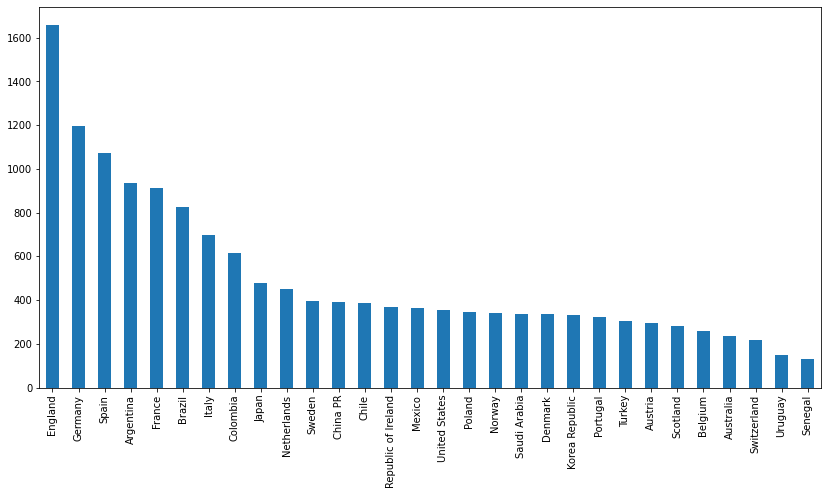

In [15]:
df.nationality.value_counts().head(n=30).plot.bar(figsize=(14,7)) # taking only 30 nationalities with players

### Conditions about specifying data for analysis
- Analytical data country -> assumption about project is that I want only analyze 5 countries which contains the most number of players in Fifa game.
- Analytical data club -> assumption that Im using only 5 clubs which contains best mean overall of players.

In [16]:
df.nationality.value_counts().head(n=30)

England                1657
Germany                1195
Spain                  1071
Argentina               936
France                  911
Brazil                  825
Italy                   699
Colombia                616
Japan                   478
Netherlands             452
Sweden                  396
China PR                390
Chile                   388
Republic of Ireland     368
Mexico                  365
United States           353
Poland                  348
Norway                  341
Saudi Arabia            337
Denmark                 335
Korea Republic          333
Portugal                322
Turkey                  303
Austria                 296
Scotland                283
Belgium                 259
Australia               236
Switzerland             220
Uruguay                 149
Senegal                 130
Name: nationality, dtype: int64

In [17]:
# Analytical data - part I
df_country=df[df.nationality.isin(df.nationality.value_counts().head(n=5).index.tolist())]
print('Percentage of whole dataset which will be included in analysis:',round(df_country.shape[0]/df_raw.shape[0],2)*100,'%.')

Percentage of whole dataset which will be included in analysis: 32.0 %.


In [18]:
# Analytical data - part II
# My criterium is this because if I will play in Manager Mode I would like to know which 5 clubs has best mean overall:
df_club=df[df.club.isin(df.groupby('club').agg({'overall':'mean'}).sort_values('overall',ascending=False).head(n=5).index.tolist())]
print('Percentage of whole dataset which will be included in analysis:',round(df_club.shape[0]/df_raw.shape[0],2)*100,'%.')

Percentage of whole dataset which will be included in analysis: 1.0 %.


# Analytical data country and questions, visualizations 
This part of notebook is analytical and I tried to build it with functions for fast change parameters, and checking other statistics. Also this part is focused on the data and countries. Descriptive statistics for each nationality which has been included in analytical data. We should know that this statistics is about potential and overall- generalised skill indicator of a player.

In [19]:
def quant_1(x):
    return x.quantile(0.25)

def quant_3(x):
    return x.quantile(0.75)


def quant_05(x):
    return x.quantile(0.05)

def quant_95(x):
    return x.quantile(0.95)

Report which has been created in the cell below can answer for following questions:
- Which country has players with best mean potential?
- Which country has players with best average overall?
- Which country has biggest wages?
- Some questions about quantiles. Example: 5% players from Portugal have potential bigger than 86. They can describe in detail overall, wage, value about specific country.
etc.

In [20]:
# In my opinion this kind of report in this case is better than function describe().
df_nationality_potential_overall=df_country.groupby('nationality').agg({'overall':['count','mean','std','min',quant_05,quant_1,'median',quant_3,quant_95,'max'],
                                                                        'potential':['mean','std','min',quant_05,quant_1,'median',quant_3,quant_95,'max'],
                                                                        'value':['mean','std','min',quant_05,quant_1,'median',quant_3,quant_95,'max'],
                                                                        'wage':['mean','std','min',quant_05,quant_1,'median',quant_3,quant_95,'max']})
df_nationality_potential_overall.columns=['_'.join(col).strip() for col in df_nationality_potential_overall.columns.values]
df_nationality_potential_overall=df_nationality_potential_overall.round(2)
# Answer which nationality has biggest mean wage.
# We can also modify this for changing on overall, potential or also value. Where is biggest mean value of player.
# Also we can get info how many players is worth more than 19 millions etc.
# In my opinion this report is very valuable for anyone who want to choose country to lead in Manager Mode.
df_nationality_potential_overall=df_nationality_potential_overall.sort_values(['value_mean'],ascending=False)
# This report can help in searching players. Thanks to this report we can check only countries with specific values, but also we know
# where we should look for players if we lead some club in our game.
df_nationality_potential_overall.T

nationality,Spain,France,Argentina,Germany,England
overall_count,1071.00,911.00,9.360000e+02,1195.00,1657.00
overall_mean,69.71,67.82,6.858000e+01,66.10,63.43
overall_std,6.49,7.01,6.170000e+00,6.64,6.80
overall_min,51.00,50.00,5.100000e+01,47.00,46.00
overall_quant_05,60.00,57.00,5.900000e+01,56.00,52.00
overall_quant_1,65.00,63.00,6.400000e+01,62.00,59.00
overall_median,69.00,68.00,6.900000e+01,66.00,63.00
overall_quant_3,74.00,73.00,7.300000e+01,70.00,67.00
overall_quant_95,81.00,80.00,7.900000e+01,79.00,76.00
overall_max,91.00,89.00,9.400000e+01,90.00,89.00


<b>Conclusion:</b> Thanks for this kind of report we can get informations about how many players is from specific country. Also we can check their mean, std, quantiles and also min max value.
Thanks to this we can infer which country are equal and we can choose them for the World Cup Tournament. 

We can also have a knowledge something about our potential rivals if for example we choosed team which contains only Senegal players. Maybe if we are playing in game Manager Mode (type of game where we are a manager of club and also sometimes manager of some country) we have some knowledge which country we should choose. Thanks to this, we know which country you can run and which has interesting football players. What is more, we also know how many players can be appointed to the team.

Moreover this report can help us with searching players which we want buy. Moreover if we have in the club players from one nationality they can have better morales etc.

### What is preffered foot in most players?

We can look on balance in attribute: preferred foot. We can see that most of players has better right foot.

<AxesSubplot:>

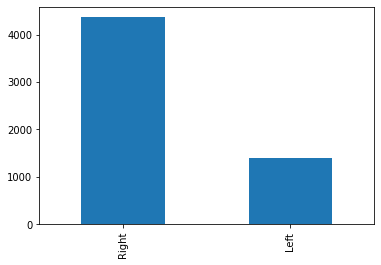

In [21]:
df_country['preferred foot'].value_counts().plot.bar()

# How looks like distribution of working rate in our nationality data?

(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 [Text(0, 0, 'Medium/ Medium'),
  Text(1, 0, 'High/ Medium'),
  Text(2, 0, 'Medium/ High'),
  Text(3, 0, 'High/ High'),
  Text(4, 0, 'Medium/ Low'),
  Text(5, 0, 'High/ Low'),
  Text(6, 0, 'Low/ Medium'),
  Text(7, 0, 'Low/ High'),
  Text(8, 0, 'Low/ Low')])

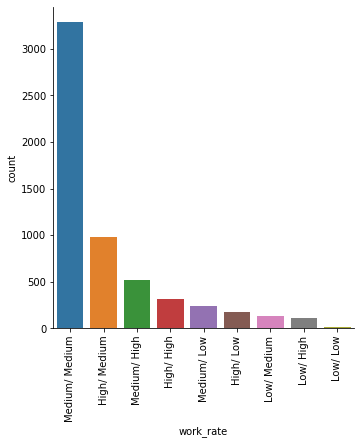

In [22]:
catplot_wr=sns.catplot(data=df_country['work rate'].value_counts().to_frame().reset_index().rename(columns={'index':'work_rate','work rate':'count'}),
                       x='work_rate',y='count',kind='bar')
plt.xticks(rotation=90)

What if we what to know something about body type of players We can see that we have some unique values. So we drop it, because we want check only typical body types. We can look also on work how many players has been asigned to specific body type rate category.

### Global data
What kind of body types we have in global data?

In [23]:
df['body type'].value_counts()

Normal                 10595
Lean                    6417
Stocky                  1140
Messi                      1
Akinfenwa                  1
Courtois                   1
Shaqiri                    1
Neymar                     1
C. Ronaldo                 1
PLAYER_BODY_TYPE_25        1
Name: body type, dtype: int64

We can notice some mess, and also special body types for unique players :)

### Analytical data
What do we have in analytical data about countries?

In [24]:
df_country['body type'].value_counts()

Normal       3349
Lean         2046
Stocky        373
Messi           1
Akinfenwa       1
Name: body type, dtype: int64

Below we have plot for most popular body types, and for analytical data. We can see that plot for global data would be very similar for our analytical data.

(array([0, 1, 2]),
 [Text(0, 0, 'Normal'), Text(1, 0, 'Lean'), Text(2, 0, 'Stocky')])

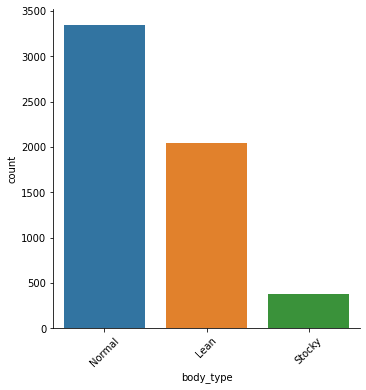

In [25]:
catplot_wr=sns.catplot(data=df_country[df_country['body type'].isin(['Lean','Stocky','Normal'])]['body type'].value_counts().to_frame().reset_index().rename(columns={'index':'body_type','body type':'count'}),
                       x='body_type',y='count',kind='bar')
plt.xticks(rotation=45)

We want to check which country has most players on specific position. Looking on this plot we can see from which position we have most players for each country. We have visualizations in percentage because it has better look.

<ipython-input-26-1eb16b8bf180>:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  return df_country[df.nationality==row].shape[0]


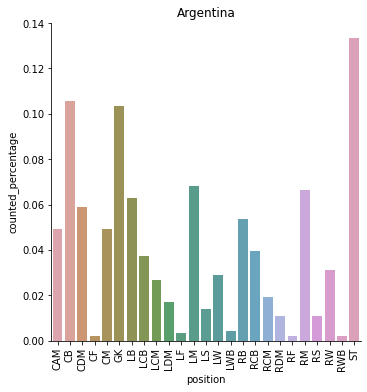

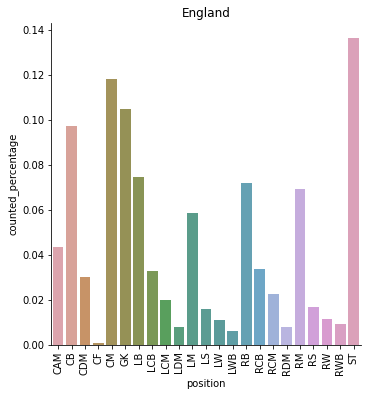

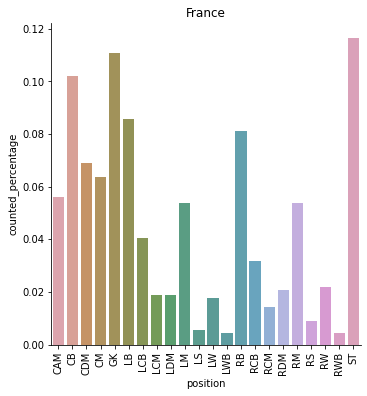

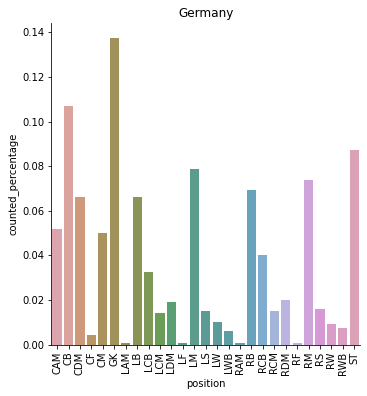

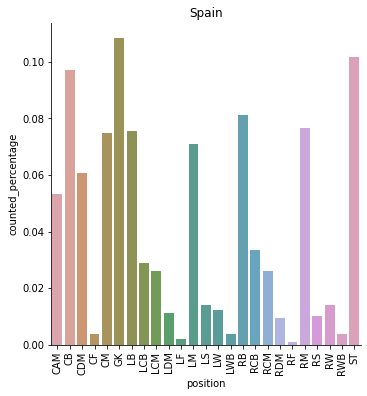

In [26]:
def get_number_of_players(row,df_country):
    return df_country[df.nationality==row].shape[0]        

df_country_nationality_position=df_country.groupby(['nationality','position']).size().to_frame().rename(columns={0:'counted'}).reset_index()
df_country_nationality_position['number_of_players']=df_country_nationality_position.nationality.apply(lambda x:get_number_of_players(x,df_country))
df_country_nationality_position['counted_percentage']=df_country_nationality_position.counted/df_country_nationality_position.number_of_players
for country in df_country_nationality_position.nationality.unique().tolist():
    sns.catplot(x="position", y="counted_percentage",
            data=df_country_nationality_position[df_country_nationality_position.nationality==country], saturation=.5,
            kind="bar")
    plt.title(country)
    plt.xticks(rotation=90)

<ipython-input-26-1eb16b8bf180>:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  return df_country[df.nationality==row].shape[0]


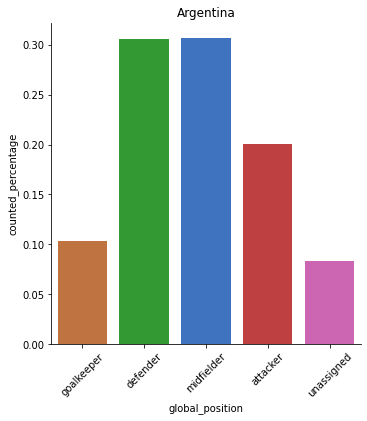

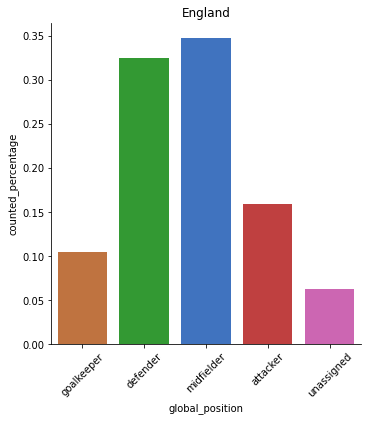

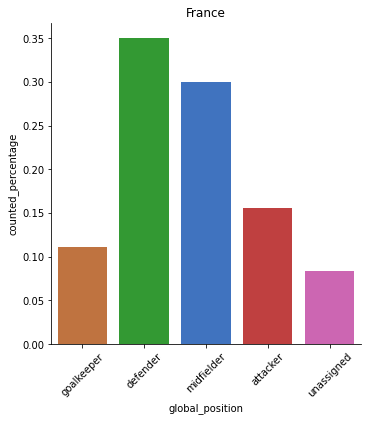

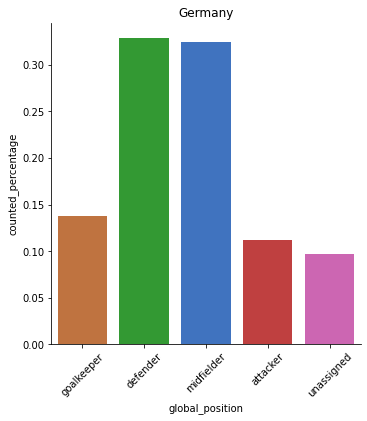

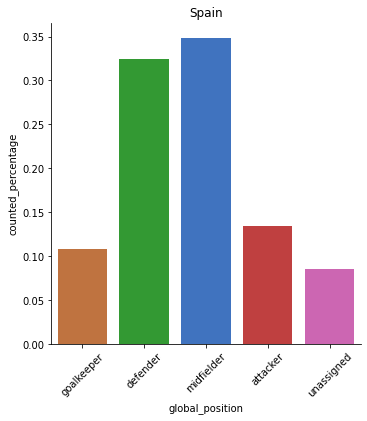

In [27]:
# I wanted to globalize positions so that's why I've added custom global groups, which are very good. And also it's improve readability of barplots for countries.
order_list=['goalkeeper','defender','midfielder','attacker','unassigned']
color_palette_dict={'goalkeeper':'#ff6600','defender':'#00cc00','midfielder':'#0066ff','attacker':'#ff0000','unassigned':'#ff33cc'}
df_country_nationality_position=df_country.groupby(['nationality','global_position']).size().to_frame().rename(columns={0:'counted'}).reset_index()
df_country_nationality_position['number_of_players']=df_country_nationality_position.nationality.apply(lambda x:get_number_of_players(x,df_country))
df_country_nationality_position['counted_percentage']=df_country_nationality_position.counted/df_country_nationality_position.number_of_players
for country in df_country_nationality_position.nationality.unique().tolist():
    sns.catplot(x="global_position", y="counted_percentage",
            data=df_country_nationality_position[df_country_nationality_position.nationality==country], saturation=.5,
            kind="bar",order=order_list,palette=color_palette_dict)
    plt.title(country)
    plt.xticks(rotation=45)

We can notice similar distributions in Argentina - Germany, and also England - Spain.

# Analyzing correlations - country data
As I mention global_position has been created by me. Colours has been selected based on Fifa colours for positions.

### Goalkeepers

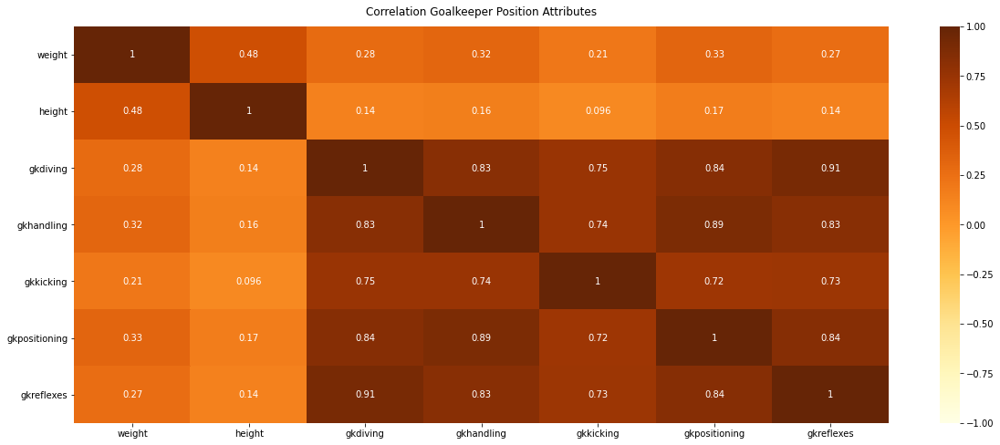

In [28]:
# Correlation between attributes. In my opinion this attributes are worth to check for goalkeepers, because they matter.
plt.figure(figsize=(20,8))
attributes=['weight','height','gkdiving', 'gkhandling','gkkicking', 'gkpositioning', 'gkreflexes']
df_gk=df_country[df_country.global_position=='goalkeeper'][attributes]
heatmap = sns.heatmap(df_gk.corr(),vmax=1,vmin=-1, annot=True,cmap='YlOrBr')

heatmap.set_title('Correlation Goalkeeper Position Attributes', fontdict={'fontsize':12}, pad=12);

Conclusion: We can see high correlation between goalkeeper parameters, which I think is expected result. But we can also see that height and weight dont have strong correlation in my opinion (strong is more than 0.5). So here we have mid correlation based on J.Guilford theorem.

I think for goalkeepers it is normal, maybe for different position we can have some different result. I took this attributes because they matter on the goalkeeper position which is specific in Fifa game.

### Defenders

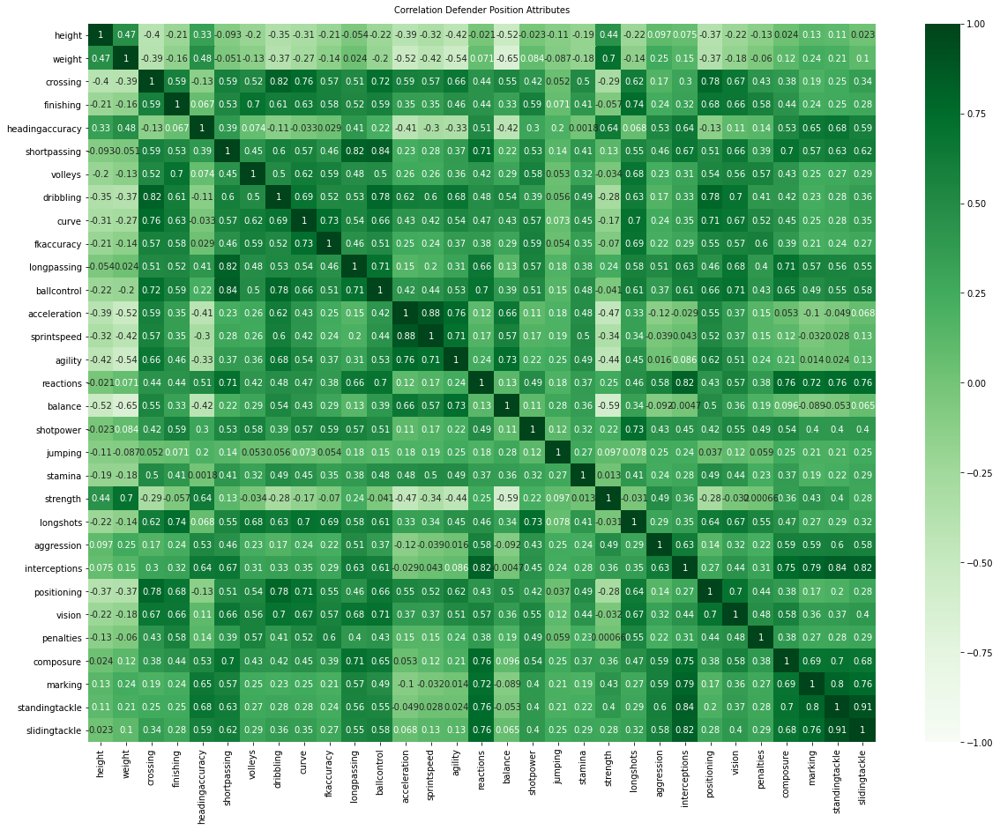

In [29]:
# Correlation between attributes for defenders.
attributes=['height', 'weight', 'crossing','finishing', 'headingaccuracy', 'shortpassing', 'volleys', 'dribbling',
            'curve', 'fkaccuracy', 'longpassing', 'ballcontrol', 'acceleration','sprintspeed', 'agility', 
            'reactions', 'balance', 'shotpower','jumping', 'stamina', 'strength', 'longshots', 'aggression',
            'interceptions', 'positioning', 'vision', 'penalties', 'composure','marking', 'standingtackle', 'slidingtackle']
position='defender'
plt.figure(figsize=(20,15))
df_gk=df_country[df_country.global_position==position][attributes]
heatmap = sns.heatmap(df_gk.corr(),vmax=1,vmin=-1, annot=True,cmap='Greens')

heatmap.set_title(f'Correlation {position.capitalize()} Position Attributes', fontdict={'fontsize':10}, pad=12);

Conclusion: I can see some correlations in defenders. For example look on: 
- positioning and dribbling 0.78 -> strong correlation;
- ball control and short passing 0.84 -> strong correlation;
- longpassing and shortpassing 0.82 -> strong correlation;

### Midfielders

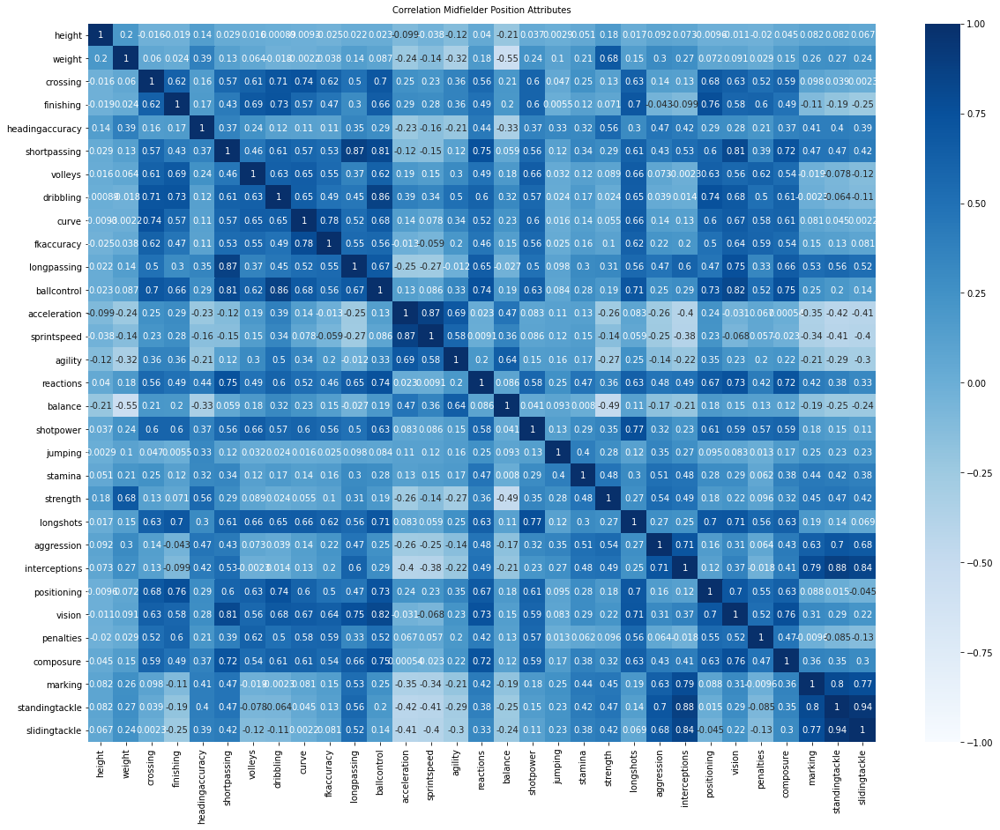

In [30]:
# Correlation between attributes for midfielders.
position='midfielder'
plt.figure(figsize=(20,15))
df_gk=df_country[df_country.global_position==position][attributes]
heatmap = sns.heatmap(df_gk.corr(),vmax=1,vmin=-1, annot=True,cmap='Blues')

heatmap.set_title(f'Correlation {position.capitalize()} Position Attributes', fontdict={'fontsize':10}, pad=12);

Conclusion: Example correlations below.
- ballcontrol and dribbling- 0.86 - strong correlation
- reactions and shortpassing- 0.75 - strong correlation
- sprintspeed and acceleration- 0.87 - strong correlation

### Attackers

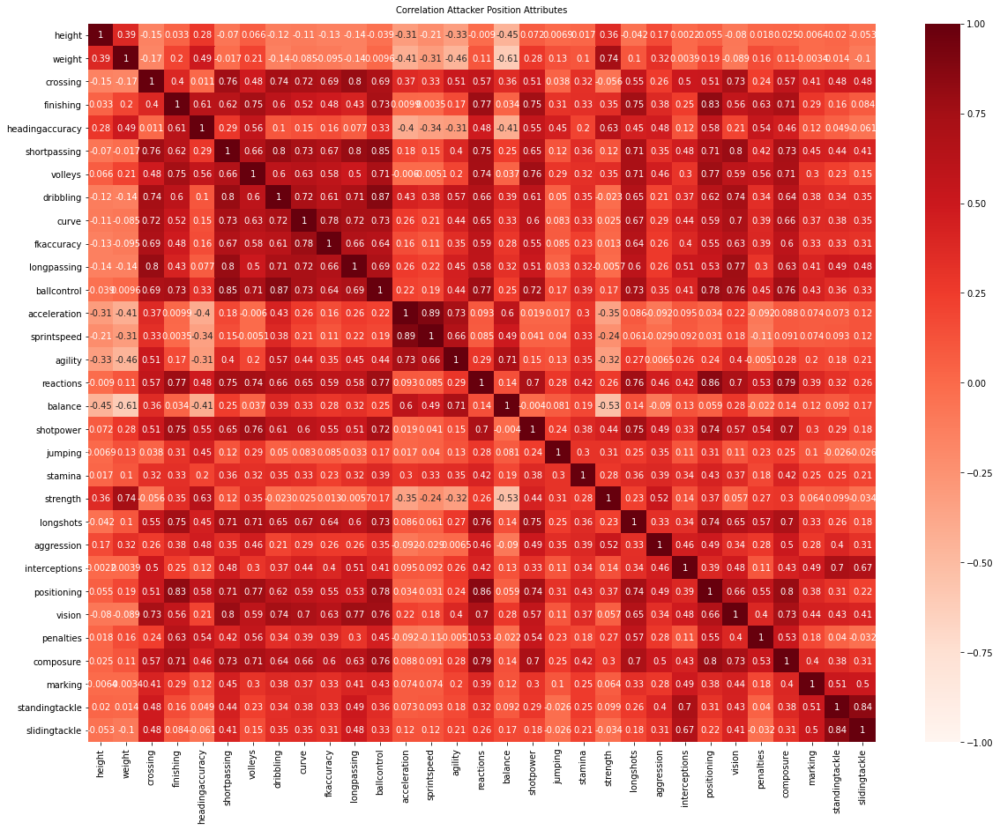

In [31]:
# Correlation between attributes for attackers.
position='attacker'
plt.figure(figsize=(20,15))
df_gk=df_country[df_country.global_position==position][attributes]
heatmap = sns.heatmap(df_gk.corr(),vmax=1,vmin=-1, annot=True,cmap='Reds')

heatmap.set_title(f'Correlation {position.capitalize()} Position Attributes', fontdict={'fontsize':10}, pad=12);

Conclusion: Example correlations below.
- vision and shortpassing- 0.8 - strong correlation
- positioning and finishing- 0.83 - strong correlation
- shotpower and volleys- 0.76 - strong correlation

### Checking group age

Global plot for each country which has been specified. And also everything is for specific value.

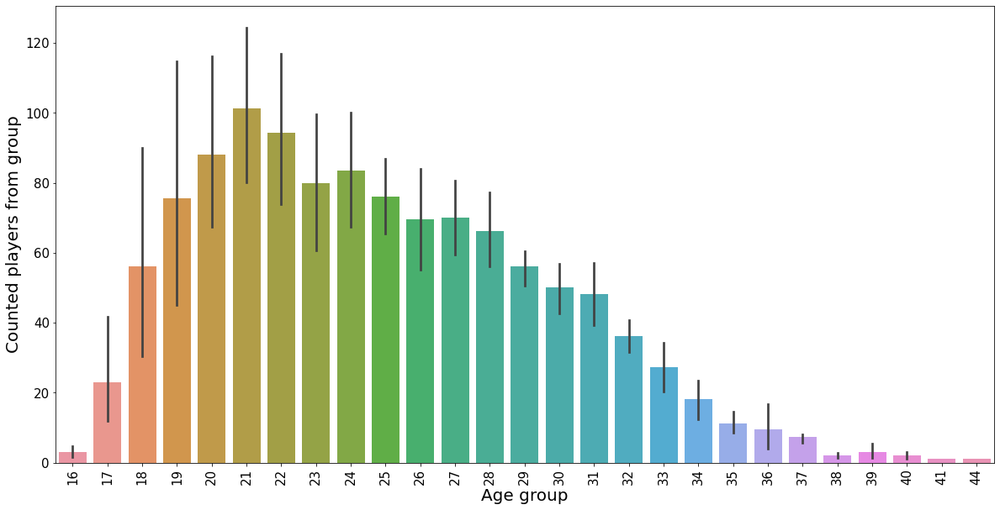

In [32]:
plt.figure(figsize=(20,10))
# Plt. title add
barplot_group_age=sns.barplot(x='age', y="count", data=df_country.groupby(['nationality','age']).size().reset_index().rename(columns={0:'count'}),)
barplot_group_age.set_xlabel("Age group",fontsize=20)
barplot_group_age.set_ylabel("Counted players from group",fontsize=20)
plt.xticks(rotation=90)
barplot_group_age.tick_params(labelsize=15)

Adding custom group is a good idea especially in visualization for category group age in specific country and also with including positions. Definitely this is more readable.

In [33]:
def get_custom_age_group(row):
    if row>15 and row<=20:
        return '15-20'
    if row>20 and row<=25:
        return '20-25'
    if row>25 and row<=30:
        return '25-30'
    if row>30 and row<=35:
        return '30-35'
    if row>35 and row<=40:
        return '35-40'
    if row>40 and row<=45:
        return '40-45'
    if row>45 and row<=50:
        return '45-50'
    if row>50 and row<=55:
        return '50-55'

df_country['custom_age_group']=df_country.age.apply(lambda x: get_custom_age_group(x)) 

<ipython-input-33-b6ababc7de80>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_country['custom_age_group']=df_country.age.apply(lambda x: get_custom_age_group(x))


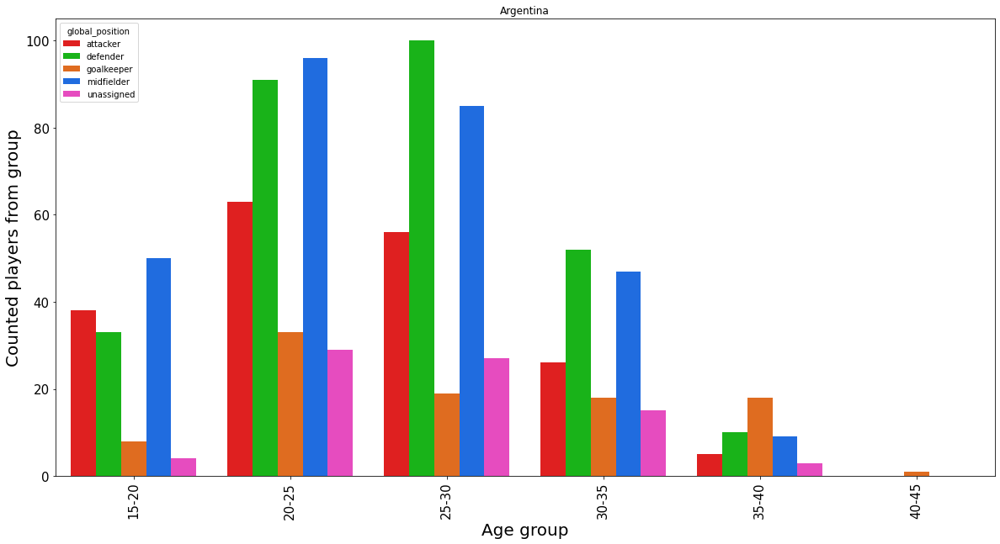

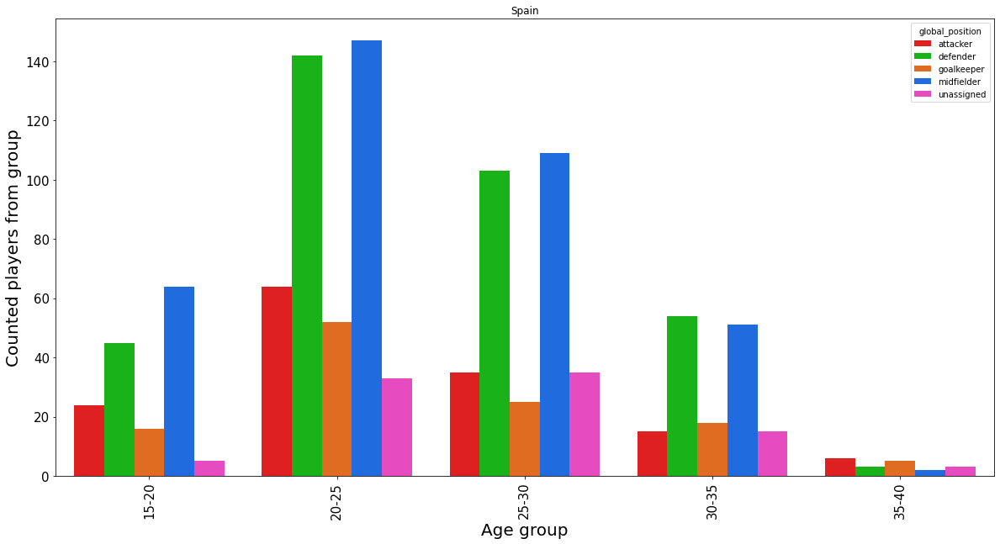

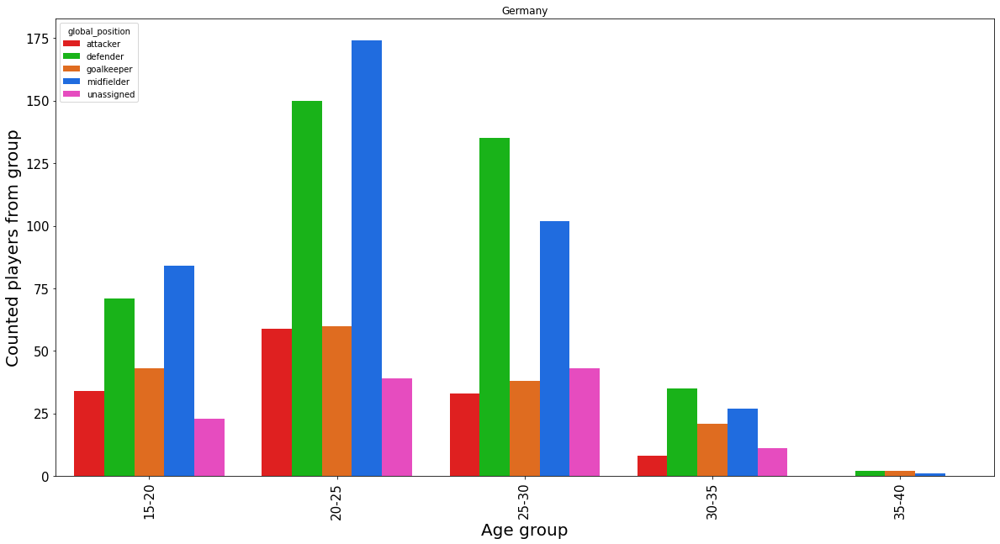

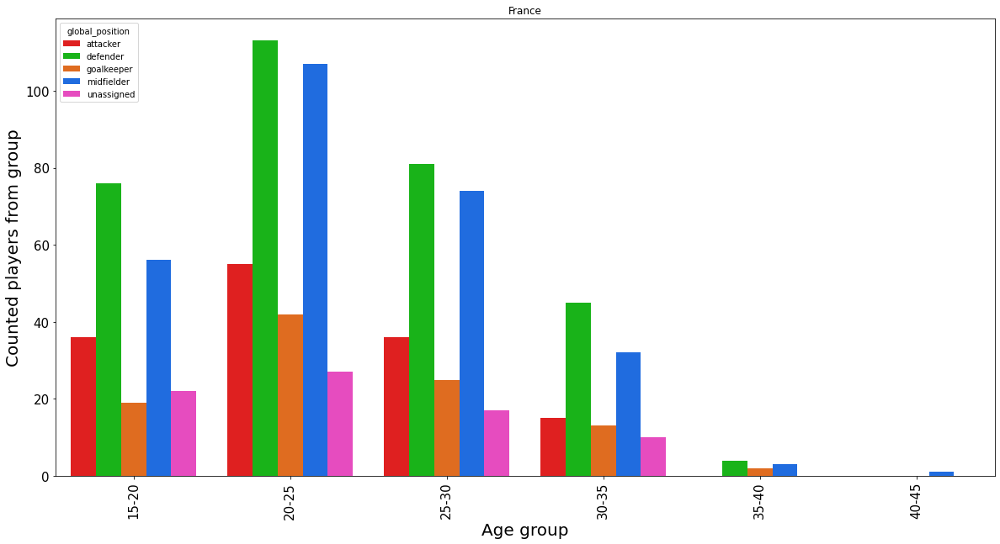

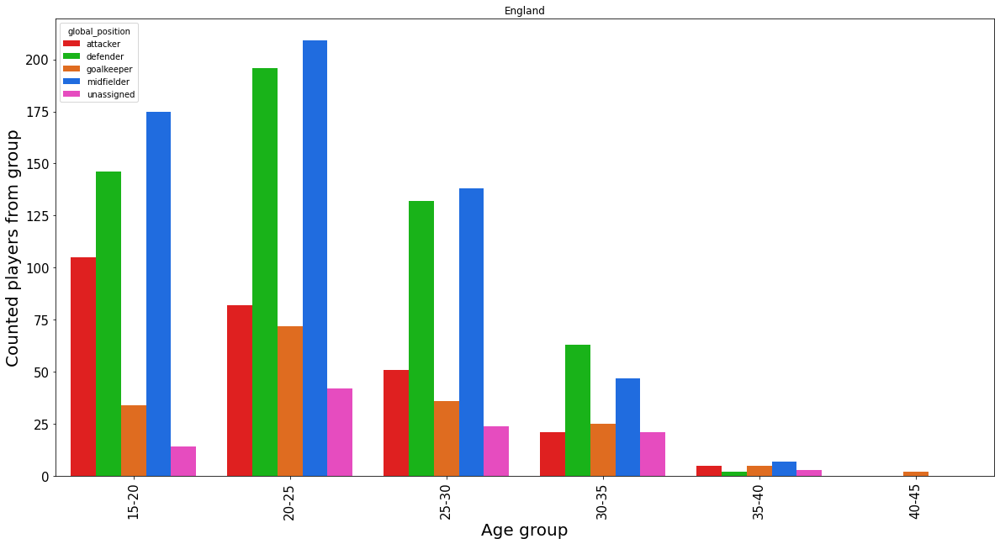

In [34]:
for country in df_country.nationality.unique().tolist():
    df_plot=df_country[df_country.nationality==country].groupby(['nationality','global_position','custom_age_group']).size().reset_index().rename(columns={0:'count'})
    plt.figure(figsize=(20,10))
    barplot_group_age=sns.barplot(x='custom_age_group', y="count",hue='global_position',
                                  data=df_plot,palette=color_palette_dict)
    barplot_group_age.set_xlabel("Age group",fontsize=20)
    barplot_group_age.set_ylabel("Counted players from group",fontsize=20)
    plt.title(country)
    plt.xticks(rotation=90)
    barplot_group_age.tick_params(labelsize=15)

Above plots: Now this plots are very useful because we can infer which positions is even good for old players. For example we can see that Goalkeepers can be old to still play in football.

# Analytical dataset - club data

<ipython-input-35-0791822d5aeb>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_club['custom_age_group']=df_club.age.apply(lambda x:get_custom_age_group(x))


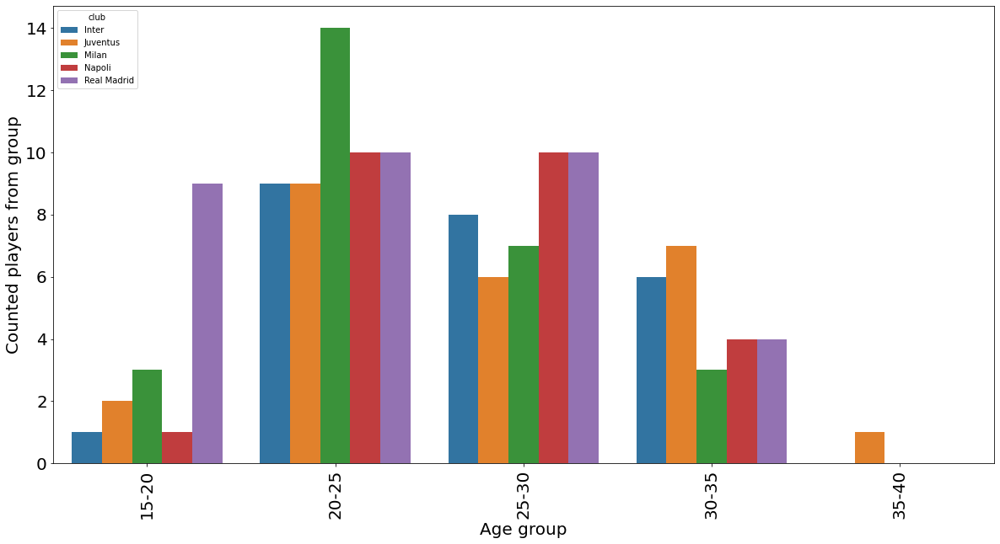

In [35]:
plt.figure(figsize=(20,10))
df_club['custom_age_group']=df_club.age.apply(lambda x:get_custom_age_group(x))
barplot_group_age=sns.barplot(x='custom_age_group', y="count",hue='club', data=df_club.groupby(['club','custom_age_group']).size().reset_index().rename(columns={0:'count'}))
barplot_group_age.set_xlabel("Age group",fontsize=20)
barplot_group_age.set_ylabel("Counted players from group",fontsize=20)
plt.xticks(rotation=90)
barplot_group_age.tick_params(labelsize=20)

Based on this plot we can infer which Team has a lot of players from specific custom group age, where we have a lots of juniors or experienced players etc.

How looks like wages and their distributions in analyzed clubs?

<ipython-input-36-471c5ccecc02>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.displot(data=df_club[df.club==club], x="wage", kind="kde")
<ipython-input-36-471c5ccecc02>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.displot(data=df_club[df.club==club], x="wage", kind="kde")
<ipython-input-36-471c5ccecc02>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.displot(data=df_club[df.club==club], x="wage", kind="kde")
<ipython-input-36-471c5ccecc02>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.displot(data=df_club[df.club==club], x="wage", kind="kde")
<ipython-input-36-471c5ccecc02>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.displot(data=df_club[df.club==club], x="wage", kind="kde")


<Figure size 1440x720 with 0 Axes>

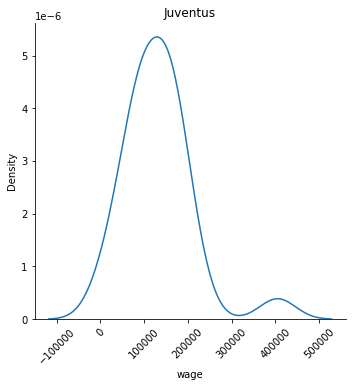

<Figure size 1440x720 with 0 Axes>

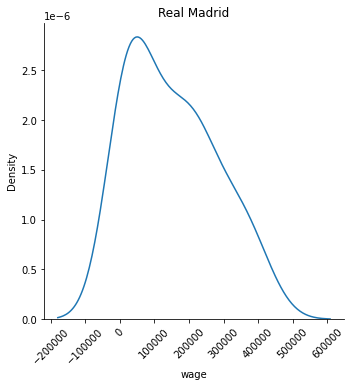

<Figure size 1440x720 with 0 Axes>

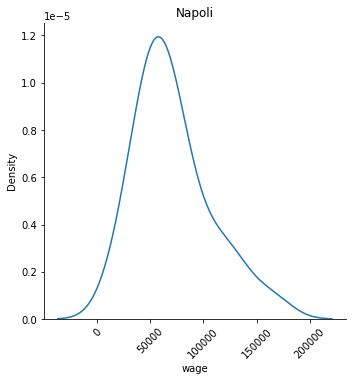

<Figure size 1440x720 with 0 Axes>

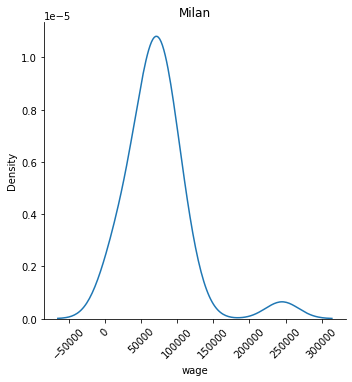

<Figure size 1440x720 with 0 Axes>

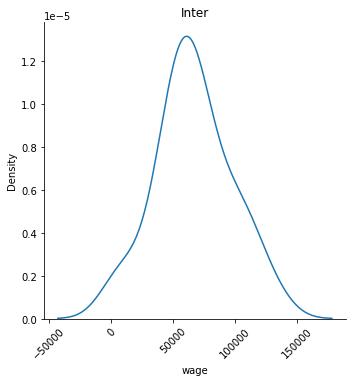

In [36]:
for club in df_club.club.unique():
    plt.figure(figsize=(20,10))
    sns.displot(data=df_club[df.club==club], x="wage", kind="kde")
    plt.title(club)
    plt.xticks(rotation=45)

In [37]:
df_club_potential_overall=df_club.groupby('club').agg({'value':['mean','std','min',quant_05,quant_1,'median',quant_3,quant_95,'max'],
                                                      'wage':['mean','std','min',quant_05,quant_1,'median',quant_3,quant_95,'max']})
df_club_potential_overall.columns=['_'.join(col).strip() for col in df_club_potential_overall.columns.values]
df_club_potential_overall=df_club_potential_overall.round(2)
df_club_potential_overall=df_club_potential_overall.sort_values(['wage_mean'],ascending=False)
df_club_potential_overall.T

club,Real Madrid,Juventus,Milan,Napoli,Inter
value_mean,26497727.27,28179000.00,15444444.44,20560000.00,19436875.00
value_std,24566535.42,20565099.48,12039880.31,15620712.75,15323251.86
value_min,350000.00,575000.00,500000.00,2500000.00,110000.00
value_quant_05,760000.00,2600000.00,2000000.00,6200000.00,1053750.00
value_quant_1,1200000.00,15500000.00,7000000.00,8500000.00,9250000.00
value_median,20000000.00,27000000.00,12500000.00,16500000.00,16750000.00
value_quant_3,50000000.00,32000000.00,19500000.00,26000000.00,24375000.00
value_quant_95,69600000.00,70900000.00,31800000.00,50100000.00,45150000.00
value_max,76500000.00,89000000.00,57000000.00,62000000.00,64500000.00
wage_mean,152030.30,131680.00,72481.48,71080.00,66500.00


Conclusion: As you see above this report can bring us a lot of useful information about wages in each club. So that's can help us to make decision which sponsor we should choose and also how to even split our budget. Split budget - how much money should we assign to wages and how much for transfers and other stuffs. Because maybe in future we want to improve value of our squad or maybe we want to improve wages etc.

<b>Final conclusion:</b> As we can see Fifa dataset has big analytical potential. So that's why author couldn't check everything about that. There is a lot of ideas to make further analysis, for example analysing players on specific positions and also even this dataset is very good for creating machine learning project like predicting value of player based on attributes etc.

# BONUS PLOT
Check intutition if data could be use for classification problem in future. So that's why I used here UMAP to reduce number of features and check this in the 3 dimensional plot.

In [38]:
import umap

# Define input

In [40]:
%%time
# Specific parameters, skills which describe positions
X=df[df.global_position!='unassigned']
print('Reduced number of players without positions, shape of data:',X.shape)
X = X.iloc[:,24:57].values
info_text='Position: '+df[df.global_position!='unassigned'].global_position+' Name: '+df[df.global_position!='unassigned'].name+' Club: '+df[df.global_position!='unassigned'].club
X_embedding=umap.UMAP(n_components=3).fit_transform(X)

Reduced number of players without positions, shape of data: (16789, 60)
CPU times: user 48.8 s, sys: 2.51 s, total: 51.3 s
Wall time: 16.2 s


In [41]:
colors=[k for e,k in color_palette_dict.items()]
custom_palette=sns.set_palette(sns.color_palette(colors))
ctc={}
ctc['goalkeeper']=(1.0, 0.4, 0.0)
ctc['defender']=(0.0, 0.8, 0.0)
ctc['midfielder']=(0.0, 0.4, 1.0)
ctc['attacker']=(1.0, 0.0, 0.0)

In [42]:
c_labels=[]
for e in df[df.global_position!='unassigned'].global_position:
    c_labels.append(ctc[e])

# Get reduced dim visualization.

In [43]:
import plotly.graph_objects as go
color_labels={'goalkeeper':'orange', 'defender':'green', 'midfielder':'blue', 'attacker':'red'}
def get_plotly_3d(embedding,c_labels,info_text):
    embedding=pd.DataFrame(embedding,columns=['c1','c2','c3'])
    fig=go.Figure(data=[go.Scatter3d(x=embedding.c1,
                                     y=embedding.c2,
                                     z=embedding.c3,
                                     mode='markers',
                                     marker=dict(size=5,color=c_labels,opacity=0.8),
                                     hovertext=info_text)])
    fig.update_layout(margin=dict(l=0,r=0,b=0,t=0),title='3d umap embedded data')
    fig.show()
    fig.write_html("plotly_file.html")

In [44]:
get_plotly_3d(X_embedding,c_labels,info_text);